In [1]:
import os
import shutil
from sklearn.model_selection import StratifiedShuffleSplit
import pprint
import numpy as np

In [2]:
# path for images and class names
p_path = '../data/labeled_images_filtered'
class_names = ['empty', 'full', 'halfempty']

In [44]:
classes_folders_dict = { 
    'empty' : os.path.join(p_path, 'empty'), 
    'full' : os.path.join(p_path, 'full'),
    'halfempty' : os.path.join(p_path, 'halfempty'),}

In [3]:
# first split file names into train valid test parts
X = []
y = []
source = []

for exist_classname in [d for d in os.listdir(p_path) if d in class_names]:
    classdir = os.path.join(p_path, exist_classname)
    photos = os.listdir(classdir)

    for p in photos:
        X.append(p)
        y.append(exist_classname)
        source.append(classdir)

X = np.array(X)
y = np.array(y)
s = np.array(source)

# classes unbalanced - so split must be stratified and randomized
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.1, random_state=42)

for train_index, valid_index in sss.split(X, y):
    X_train, X_valid = X[train_index], X[valid_index]
    y_train, y_valid = y[train_index], y[valid_index]
    s_train, s_valid = s[train_index], s[valid_index]
    
for train_index, test_index in sss.split(X_train, y_train):
    X_train, X_test = X_train[train_index], X_train[test_index]
    y_train, y_test = y_train[train_index], y_train[test_index]
    s_train, s_test = s_train[train_index], s_train[test_index]
    
print('TRAIN SIZE:', len(X_train)) 
print('VALID SIZE:',  len(X_valid))
print('TEST SIZE:', len(X_test))

TRAIN SIZE: 1775
VALID SIZE: 220
TEST SIZE: 198


In [10]:
# copy files according to corresponding split directories
root_lf_path = '../data/ds'

test_lf_path = os.path.join(root_lf_path, 'test')
valid_lf_path = os.path.join(root_lf_path, 'validation')
train_lf_path = os.path.join(root_lf_path, 'train')

In [45]:
# copy files according to corresponding split directories
root_lf_path = '../data/ds'

test_lf_path = os.path.join(root_lf_path, 'test')
valid_lf_path = os.path.join(root_lf_path, 'validation')
train_lf_path = os.path.join(root_lf_path, 'train')

# execute for the first class directory creation
os.makedirs(test_lf_path, exist_ok=True)
os.makedirs(valid_lf_path, exist_ok=True)
os.makedirs(train_lf_path, exist_ok=True)

for i in range(len(X_train)):
    classdir = os.path.join(train_lf_path, y_train[i])
    os.makedirs(classdir, exist_ok=True)
    shutil.copy(os.path.join(s_train[i], X_train[i]), os.path.join(classdir,  X_train[i]))

for i in range(len(X_valid)):
    classdir = os.path.join(valid_lf_path, y_valid[i])
    os.makedirs(classdir, exist_ok=True)
    shutil.copy(os.path.join(s_valid[i], X_valid[i]), os.path.join(classdir,  X_valid[i]))
    
for i in range(len(X_test)):
    classdir = os.path.join(test_lf_path, y_test[i])
    os.makedirs(classdir, exist_ok=True)
    shutil.copy(os.path.join(s_test[i], X_test[i]), os.path.join(classdir,  X_test[i]))

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
import tensorflow as tf
from tensorflow import keras

In [6]:
# Check tf version
print(tf.__version__)

2.10.1


In [7]:
# Check if GPU available
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [8]:
from tensorflow.keras.preprocessing.image import load_img

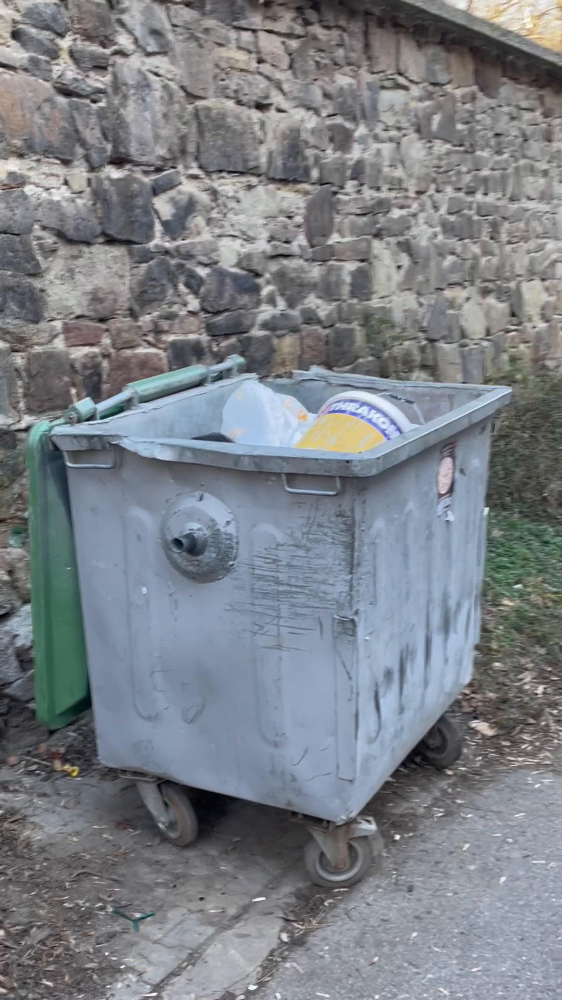

In [53]:
# Example of full trash can
path = os.path.join(root_lf_path, 'train\\full', 'IMG_1998_00066.jpg')
load_img(path)

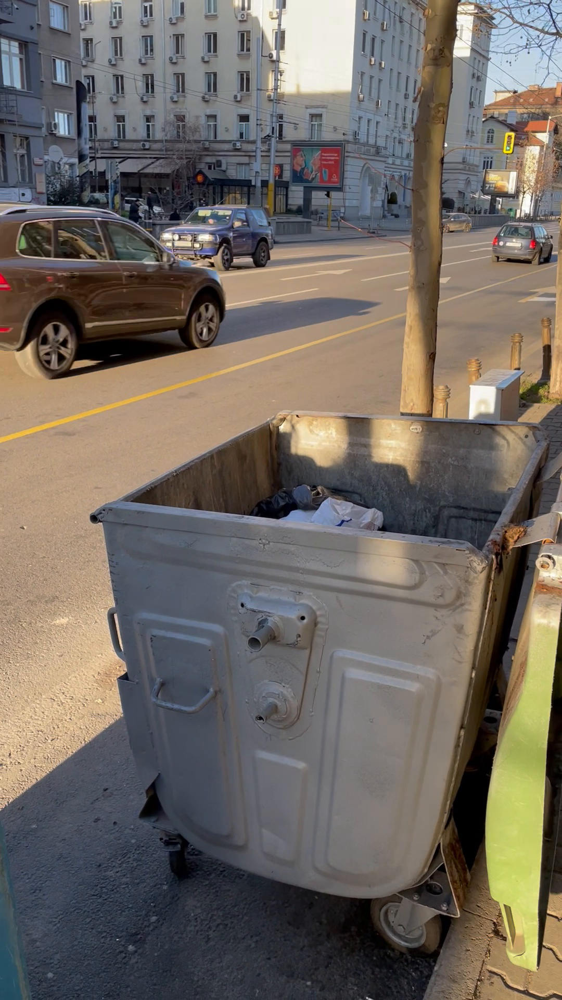

In [19]:
# Example of halfempty trash can
path = os.path.join(root_lf_path, 'train\\halfempty', 'IMG_2014_00049.jpg')
load_img(path)

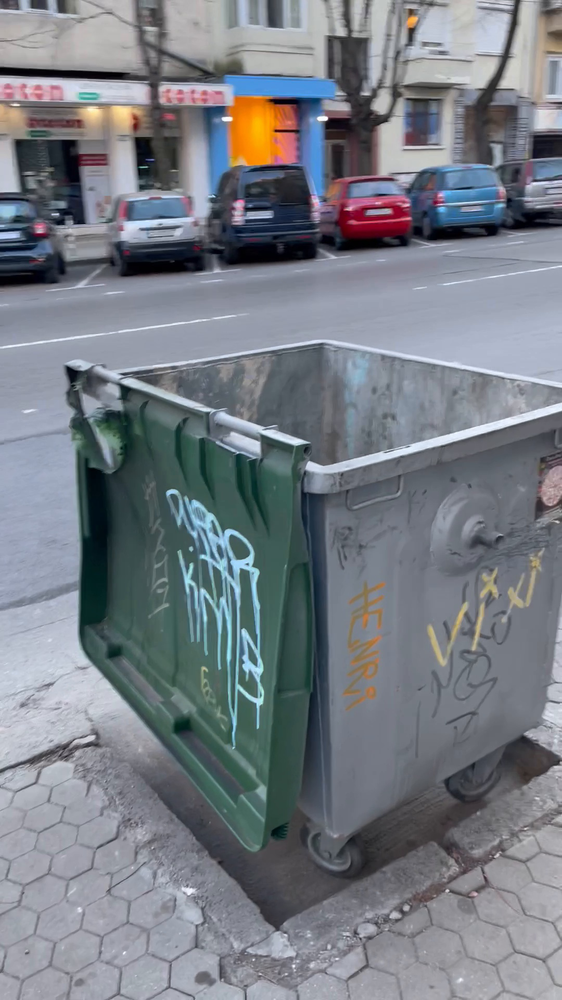

In [22]:
# Example of empty trash can
path = os.path.join(root_lf_path, 'train\\empty', 'IMG_2023_00061.jpg')
load_img(path)

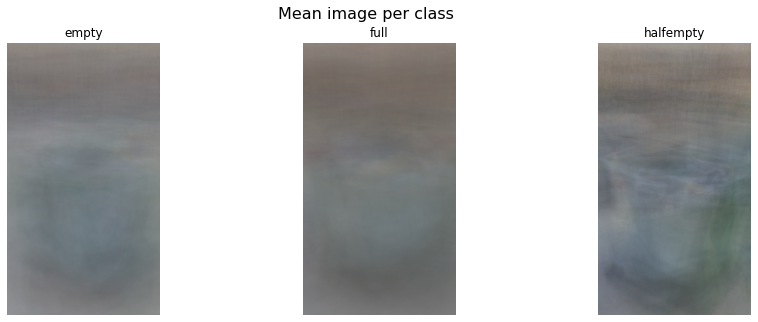

In [48]:
def get_mean_image(folder, input_size_w, input_size_h):
    mean_image = np.zeros((input_size_w, input_size_h, 3))
    files = os.listdir(folder)
    for f in files:
        img = load_img(os.path.join(folder,f), target_size=(input_size_w, input_size_h))
        image = np.array(img, dtype=np.float32) / len(files)
        mean_image = mean_image + image
    return mean_image / 255

mean_images = np.zeros((len(class_names), 1920, 1080, 3))

fig, axs = plt.subplots(1, len(class_names), figsize=(15, 5))
fig.suptitle('Mean image per class', fontsize=16)

for idx, cls in enumerate(class_names):
    mean_images[idx] = get_mean_image(classes_folders_dict[cls],  1920, 1080)
    axs[idx].imshow(mean_images[idx])
    axs[idx].set_title(cls)
    axs[idx].axis('off')

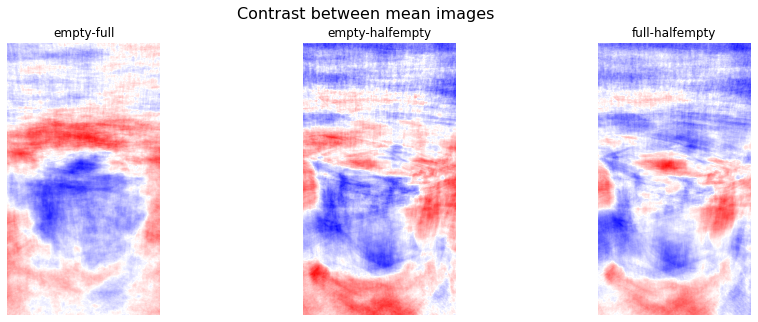

In [52]:
fig, axs = plt.subplots(1, len(class_names), figsize=(15, 5))
fig.suptitle('Contrast between mean images', fontsize=16)
count = -1
for idx_1 in range(len(class_names)):
    for idx_2 in range(len(class_names)):
        if idx_1 >= idx_2: 
            continue
        count += 1
        contrast_image = mean_images[idx_1] - mean_images[idx_2]
        axs[count].imshow(np.mean(contrast_image, axis=-1), cmap='bwr')
        axs[count].set_title(f'{class_names[idx_1]}-{class_names[idx_2]}')
        axs[count].axis('off')

# Model Training

In [23]:
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.xception import preprocess_input
from tensorflow.keras.applications.xception import decode_predictions

In [24]:
# Using Xception model trained on imagenet for backbone in transfer learning
model = Xception(weights='imagenet', input_shape=(299, 299, 3))

In [25]:
img = load_img(path, target_size=(299, 299))
X = np.array([ np.array(img)])
X = preprocess_input(X)

In [26]:
pred = model.predict(X)

1/1 [==============================] - 1s 593ms/step


In [27]:
decode_predictions(pred)

[[('n02747177', 'ashcan', 0.65450895),
  ('n03127925', 'crate', 0.25157854),
  ('n03014705', 'chest', 0.007198225),
  ('n03417042', 'garbage_truck', 0.006000383),
  ('n02971356', 'carton', 0.0054463404)]]

## Preparing data

In [28]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [29]:
train_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_ds = train_gen.flow_from_directory(
    train_lf_path,
    target_size=(150, 150),
    batch_size=32
)

Found 1775 images belonging to 3 classes.


In [30]:
train_ds.class_indices

{'empty': 0, 'full': 1, 'halfempty': 2}

In [31]:
val_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

val_ds = val_gen.flow_from_directory(
    valid_lf_path,
    target_size=(150, 150),
    batch_size=32,
    shuffle=False
)

Found 220 images belonging to 3 classes.


## Test training

In [32]:
base_model = Xception(
    weights='imagenet',
    include_top=False,
    input_shape=(150, 150, 3)
)

base_model.trainable = False
inputs = keras.Input(shape=(150, 150, 3))
base = base_model(inputs, training=False)
vectors = keras.layers.GlobalAveragePooling2D()(base)
outputs = keras.layers.Dense(3)(vectors)
model = keras.Model(inputs, outputs)

In [36]:
learning_rate = 0.01
optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
loss = keras.losses.CategoricalCrossentropy(from_logits=True)
model.compile(optimizer=optimizer, loss=loss, metrics=[keras.metrics.CategoricalAccuracy()])

In [37]:
history = model.fit(train_ds, epochs=10, validation_data=val_ds)

Epoch 1/10
56/56 [==============================] - 54s 923ms/step - loss: 1.0444 - categorical_accuracy: 0.7375 - val_loss: 0.2977 - val_categorical_accuracy: 0.8864
Epoch 2/10
56/56 [==============================] - 42s 751ms/step - loss: 0.1383 - categorical_accuracy: 0.9459 - val_loss: 0.1441 - val_categorical_accuracy: 0.9500
Epoch 3/10
56/56 [==============================] - 41s 737ms/step - loss: 0.0502 - categorical_accuracy: 0.9927 - val_loss: 0.0749 - val_categorical_accuracy: 0.9727
Epoch 4/10
56/56 [==============================] - 41s 737ms/step - loss: 0.0343 - categorical_accuracy: 0.9955 - val_loss: 0.0664 - val_categorical_accuracy: 0.9727
Epoch 5/10
56/56 [==============================] - 41s 741ms/step - loss: 0.0226 - categorical_accuracy: 0.9994 - val_loss: 0.0533 - val_categorical_accuracy: 0.9818
Epoch 6/10
56/56 [==============================] - 41s 739ms/step - loss: 0.0162 - categorical_accuracy: 0.9989 - val_loss: 0.0521 - val_categorical_accuracy: 0.981

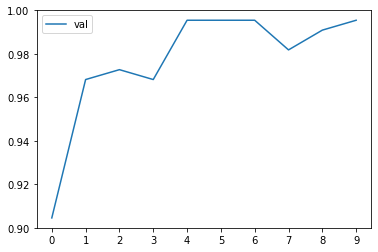

In [54]:
plt.plot(history.history['val_accuracy'], label='val')
plt.xticks(np.arange(10))
plt.legend()

## Adjusting the learning rate

* What's the learning rate
* Trying different values

In [55]:
def make_model(learning_rate=0.01):
    base_model = Xception(
        weights='imagenet',
        include_top=False,
        input_shape=(150, 150, 3)
    )

    base_model.trainable = False

    #########################################

    inputs = keras.Input(shape=(150, 150, 3))
    base = base_model(inputs, training=False)
    vectors = keras.layers.GlobalAveragePooling2D()(base)
    outputs = keras.layers.Dense(3)(vectors)
    model = keras.Model(inputs, outputs)
    
    #########################################

    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    loss = keras.losses.CategoricalCrossentropy(from_logits=True)

    model.compile(
        optimizer=optimizer,
        loss=loss,
        metrics=['accuracy']
    )
    
    return model

In [56]:
scores = {}

for lr in [0.0001, 0.001, 0.01, 0.1]:
    print(lr)

    model = make_model(learning_rate=lr)
    history = model.fit(train_ds, epochs=10, validation_data=val_ds)
    scores[lr] = history.history

    print()
    print()

0.0001
Epoch 1/10
56/56 [==============================] - 43s 724ms/step - loss: 1.0299 - accuracy: 0.4608 - val_loss: 0.8490 - val_accuracy: 0.6182
Epoch 2/10
56/56 [==============================] - 39s 705ms/step - loss: 0.7999 - accuracy: 0.6507 - val_loss: 0.7652 - val_accuracy: 0.7045
Epoch 3/10
56/56 [==============================] - 40s 714ms/step - loss: 0.7090 - accuracy: 0.7211 - val_loss: 0.7002 - val_accuracy: 0.7545
Epoch 4/10
56/56 [==============================] - 39s 703ms/step - loss: 0.6408 - accuracy: 0.7628 - val_loss: 0.6453 - val_accuracy: 0.7682
Epoch 5/10
56/56 [==============================] - 40s 706ms/step - loss: 0.5854 - accuracy: 0.7859 - val_loss: 0.6032 - val_accuracy: 0.7818
Epoch 6/10
56/56 [==============================] - 40s 706ms/step - loss: 0.5405 - accuracy: 0.8096 - val_loss: 0.5669 - val_accuracy: 0.7955
Epoch 7/10
56/56 [==============================] - 40s 709ms/step - loss: 0.5012 - accuracy: 0.8276 - val_loss: 0.5407 - val_accuracy:

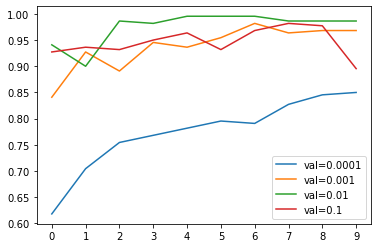

In [57]:
for lr, hist in scores.items():
    #plt.plot(hist['accuracy'], label=('train=%s' % lr))
    plt.plot(hist['val_accuracy'], label=('val=%s' % lr))

plt.xticks(np.arange(10))
plt.legend()

In [58]:
# learning_rate selected
learning_rate = 0.01

## Adding more layers


* Adding one inner dense layer
* Experimenting with different sizes of inner layer

In [64]:
def make_model(learning_rate=0.01, size_inner=100):
    base_model = Xception(
        weights='imagenet',
        include_top=False,
        input_shape=(150, 150, 3)
    )

    base_model.trainable = False

    #########################################

    inputs = keras.Input(shape=(150, 150, 3))
    base = base_model(inputs, training=False)
    vectors = keras.layers.GlobalAveragePooling2D()(base)
    
    inner = keras.layers.Dense(size_inner, activation='relu')(vectors)
    
    outputs = keras.layers.Dense(3)(inner)
    
    model = keras.Model(inputs, outputs)
    
    #########################################

    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    loss = keras.losses.CategoricalCrossentropy(from_logits=True)

    model.compile(
        optimizer=optimizer,
        loss=loss,
        metrics=['accuracy']
    )
    
    return model

In [65]:
learning_rate = 0.01

scores = {}

for size in [10, 100, 1000]:
    print(size)

    model = make_model(learning_rate=learning_rate, size_inner=size)
    history = model.fit(train_ds, epochs=10, validation_data=val_ds)
    scores[size] = history.history

    print()
    print()

10
Epoch 1/10
56/56 [==============================] - 44s 740ms/step - loss: 1.0827 - accuracy: 0.5279 - val_loss: 0.9529 - val_accuracy: 0.5773
Epoch 2/10
56/56 [==============================] - 40s 720ms/step - loss: 0.9188 - accuracy: 0.5792 - val_loss: 0.8956 - val_accuracy: 0.5773
Epoch 3/10
56/56 [==============================] - 40s 722ms/step - loss: 0.8876 - accuracy: 0.5792 - val_loss: 0.8817 - val_accuracy: 0.5773
Epoch 4/10
56/56 [==============================] - 40s 721ms/step - loss: 0.8795 - accuracy: 0.5792 - val_loss: 0.8772 - val_accuracy: 0.5773
Epoch 5/10
56/56 [==============================] - 40s 721ms/step - loss: 0.8764 - accuracy: 0.5792 - val_loss: 0.8758 - val_accuracy: 0.5773
Epoch 6/10
56/56 [==============================] - 41s 731ms/step - loss: 0.8758 - accuracy: 0.5792 - val_loss: 0.8755 - val_accuracy: 0.5773
Epoch 7/10
56/56 [==============================] - 43s 761ms/step - loss: 0.8757 - accuracy: 0.5792 - val_loss: 0.8753 - val_accuracy: 0.5

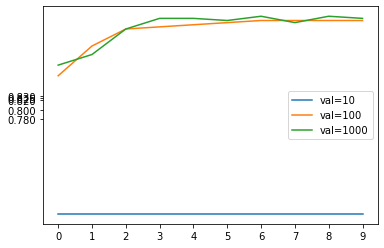

In [66]:
for size, hist in scores.items():
    plt.plot(hist['val_accuracy'], label=('val=%s' % size))

plt.xticks(np.arange(10))
plt.yticks([0.78, 0.80, 0.82, 0.825, 0.83])
plt.legend()

In [ ]:
# size_inner selected
size_inner = 100

## Regularization and dropout

* Regularizing by freezing a part of the network
* Adding dropout to our model
* Experimenting with different values

In [79]:
def make_model(learning_rate=0.01, size_inner=100, droprate=0.5):
    base_model = Xception(
        weights='imagenet',
        include_top=False,
        input_shape=(150, 150, 3)
    )

    base_model.trainable = False

    #########################################

    inputs = keras.Input(shape=(150, 150, 3))
    base = base_model(inputs, training=False)
    vectors = keras.layers.GlobalAveragePooling2D()(base)
    
    inner = keras.layers.Dense(size_inner, activation='relu')(vectors)
    drop = keras.layers.Dropout(droprate)(inner)
    
    outputs = keras.layers.Dense(3)(drop)
    
    model = keras.Model(inputs, outputs)
    
    #########################################

    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    loss = keras.losses.CategoricalCrossentropy(from_logits=True)

    model.compile(
        optimizer=optimizer,
        loss=loss,
        metrics=['accuracy']
    )
    
    return model

In [81]:
learning_rate = 0.01
size = 100

scores = {}
for droprate in [0.0, 0.2, 0.5, 0.8]:
    print(droprate)

    model = make_model(
        learning_rate=learning_rate,
        size_inner=size,
        droprate=droprate
    )

    history = model.fit(train_ds, epochs=30, validation_data=val_ds)
    scores[droprate] = history.history

    print()
    print()

0.2
Epoch 1/30
56/56 [==============================] - 45s 760ms/step - loss: 1.2709 - accuracy: 0.6806 - val_loss: 0.4676 - val_accuracy: 0.7773
Epoch 2/30
56/56 [==============================] - 41s 730ms/step - loss: 0.2616 - accuracy: 0.9003 - val_loss: 0.1660 - val_accuracy: 0.9364
Epoch 3/30
56/56 [==============================] - 40s 722ms/step - loss: 0.1245 - accuracy: 0.9555 - val_loss: 0.0816 - val_accuracy: 0.9727
Epoch 4/30
56/56 [==============================] - 41s 734ms/step - loss: 0.1346 - accuracy: 0.9448 - val_loss: 0.0730 - val_accuracy: 0.9909
Epoch 5/30
56/56 [==============================] - 43s 760ms/step - loss: 0.0779 - accuracy: 0.9746 - val_loss: 0.0508 - val_accuracy: 0.9864
Epoch 6/30
56/56 [==============================] - 42s 752ms/step - loss: 0.0801 - accuracy: 0.9673 - val_loss: 0.0913 - val_accuracy: 0.9500
Epoch 7/30
56/56 [==============================] - 42s 759ms/step - loss: 0.1090 - accuracy: 0.9583 - val_loss: 0.1198 - val_accuracy: 0.

Epoch 28/30
56/56 [==============================] - 40s 723ms/step - loss: 0.1447 - accuracy: 0.9403 - val_loss: 0.0517 - val_accuracy: 0.9727
Epoch 29/30
56/56 [==============================] - 41s 723ms/step - loss: 0.1115 - accuracy: 0.9555 - val_loss: 0.0610 - val_accuracy: 0.9773
Epoch 30/30
56/56 [==============================] - 41s 723ms/step - loss: 0.1258 - accuracy: 0.9454 - val_loss: 0.0331 - val_accuracy: 0.9864


0.8
Epoch 1/30
56/56 [==============================] - 44s 744ms/step - loss: 1.6475 - accuracy: 0.5617 - val_loss: 0.7542 - val_accuracy: 0.5818
Epoch 2/30
56/56 [==============================] - 41s 724ms/step - loss: 0.8161 - accuracy: 0.6107 - val_loss: 0.6083 - val_accuracy: 0.7000
Epoch 3/30
56/56 [==============================] - 41s 724ms/step - loss: 0.7946 - accuracy: 0.5854 - val_loss: 0.6507 - val_accuracy: 0.6227
Epoch 4/30
56/56 [==============================] - 41s 729ms/step - loss: 0.7678 - accuracy: 0.6011 - val_loss: 0.6266 - val_accurac

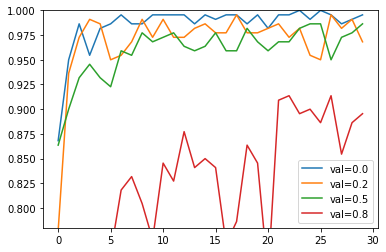

In [84]:
for droprate, hist in scores.items():
    plt.plot(hist['val_accuracy'], label=('val=%s' % droprate))

plt.ylim(0.78, 1.00)
plt.legend()

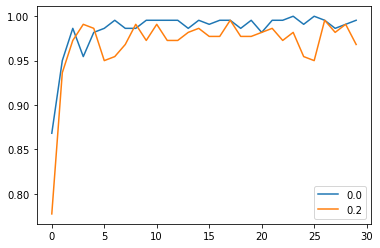

In [85]:
hist = scores[0.0]
plt.plot(hist['val_accuracy'], label=0.0)

hist = scores[0.2]
plt.plot(hist['val_accuracy'], label=0.2)

plt.legend()


## Data augmentation

* Different data augmentations
* Training a model with augmentations
* How to select data augmentations?

In [86]:
train_gen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
#     vertical_flip=True,
)

train_ds = train_gen.flow_from_directory(
    train_lf_path,
    target_size=(150, 150),
    batch_size=32
)

val_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

val_ds = val_gen.flow_from_directory(
    valid_lf_path,
    target_size=(150, 150),
    batch_size=32,
    shuffle=False
)

Found 1775 images belonging to 3 classes.
Found 220 images belonging to 3 classes.


In [87]:
learning_rate = 0.01
size = 100
droprate = 0.0

model = make_model(
    learning_rate=learning_rate,
    size_inner=size,
    droprate=droprate
)

history = model.fit(train_ds, epochs=50, validation_data=val_ds)

Epoch 1/50
56/56 [==============================] - 46s 775ms/step - loss: 1.1596 - accuracy: 0.7820 - val_loss: 0.2464 - val_accuracy: 0.9091
Epoch 2/50
56/56 [==============================] - 42s 755ms/step - loss: 0.1189 - accuracy: 0.9679 - val_loss: 0.1342 - val_accuracy: 0.9545
Epoch 3/50
56/56 [==============================] - 42s 754ms/step - loss: 0.0465 - accuracy: 0.9899 - val_loss: 0.0612 - val_accuracy: 0.9818
Epoch 4/50
56/56 [==============================] - 42s 753ms/step - loss: 0.0175 - accuracy: 0.9994 - val_loss: 0.0425 - val_accuracy: 0.9909
Epoch 5/50
56/56 [==============================] - 42s 752ms/step - loss: 0.0105 - accuracy: 1.0000 - val_loss: 0.0404 - val_accuracy: 0.9955
Epoch 6/50
56/56 [==============================] - 42s 752ms/step - loss: 0.0069 - accuracy: 1.0000 - val_loss: 0.0309 - val_accuracy: 0.9955
Epoch 7/50
56/56 [==============================] - 42s 751ms/step - loss: 0.0035 - accuracy: 1.0000 - val_loss: 0.0291 - val_accuracy: 0.9818

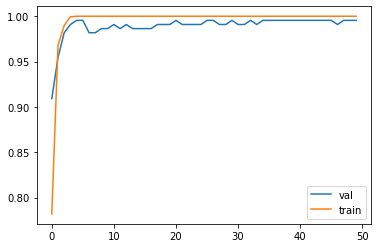

In [88]:
hist = history.history
plt.plot(hist['val_accuracy'], label='val')
plt.plot(hist['accuracy'], label='train')

plt.legend()

## Training a larger model

* Train a 299x299 model

In [95]:
def make_model(input_size=150, learning_rate=0.01, size_inner=100,
               droprate=0.2):

    base_model = Xception(
        weights='imagenet',
        include_top=False,
        input_shape=(input_size, input_size, 3)
    )

    base_model.trainable = False

    #########################################

    inputs = keras.Input(shape=(input_size, input_size, 3))
    base = base_model(inputs, training=False)
    vectors = keras.layers.GlobalAveragePooling2D()(base)
    
    inner = keras.layers.Dense(size_inner, activation='relu')(vectors)
    drop = keras.layers.Dropout(droprate)(inner)
    
    outputs = keras.layers.Dense(3)(drop)
    
    model = keras.Model(inputs, outputs)
    
    #########################################

    optimizer = keras.optimizers.Adam(learning_rate=learning_rate)
    loss = keras.losses.CategoricalCrossentropy(from_logits=True)

    model.compile(
        optimizer=optimizer,
        loss=loss,
        metrics=['accuracy']
    )
    
    return model

In [96]:
input_size = 299

In [97]:
train_gen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    shear_range=10,
    zoom_range=0.1,
    horizontal_flip=True
)

train_ds = train_gen.flow_from_directory(
    train_lf_path,
    target_size=(input_size, input_size),
    batch_size=32
)


val_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

val_ds = train_gen.flow_from_directory(
    valid_lf_path,
    target_size=(input_size, input_size),
    batch_size=32,
    shuffle=False
)

Found 1775 images belonging to 3 classes.
Found 220 images belonging to 3 classes.


In [98]:
checkpoint = keras.callbacks.ModelCheckpoint(
    'xception_v4_1_{epoch:02d}_{val_accuracy:.3f}.h5',
    save_best_only=True,
    monitor='val_accuracy',
    mode='max'
)

In [99]:
learning_rate = 0.01
size = 100
droprate = 0.2

model = make_model(
    input_size=input_size,
    learning_rate=learning_rate,
    size_inner=size,
    droprate=droprate
)

history = model.fit(train_ds, epochs=50, validation_data=val_ds,
                   callbacks=[checkpoint])

Epoch 1/50
56/56 [==============================] - 70s 1s/step - loss: 0.5696 - accuracy: 0.7842 - val_loss: 0.3540 - val_accuracy: 0.8909
Epoch 2/50
56/56 [==============================] - 67s 1s/step - loss: 0.2351 - accuracy: 0.9392 - val_loss: 0.1834 - val_accuracy: 0.9591
Epoch 3/50
56/56 [==============================] - 67s 1s/step - loss: 0.1423 - accuracy: 0.9707 - val_loss: 0.1156 - val_accuracy: 0.9773
Epoch 4/50
56/56 [==============================] - 68s 1s/step - loss: 0.0904 - accuracy: 0.9808 - val_loss: 0.0794 - val_accuracy: 0.9818
Epoch 5/50
56/56 [==============================] - 66s 1s/step - loss: 0.0672 - accuracy: 0.9870 - val_loss: 0.0671 - val_accuracy: 0.9818
Epoch 6/50
56/56 [==============================] - 66s 1s/step - loss: 0.0578 - accuracy: 0.9887 - val_loss: 0.0435 - val_accuracy: 1.0000
Epoch 7/50
56/56 [==============================] - 65s 1s/step - loss: 0.0382 - accuracy: 0.9949 - val_loss: 0.0380 - val_accuracy: 0.9955
Epoch 8/50
56/56 [==

In [160]:
model.save('model_v4_final.h5', save_format='h5')

## Using the model

* Loading the model
* Evaluating the model
* Getting predictions

In [1]:
import tensorflow as tf
from tensorflow import keras

In [2]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img

from tensorflow.keras.applications.xception import preprocess_input

In [7]:
test_gen = ImageDataGenerator(preprocessing_function=preprocess_input)

test_ds = test_gen.flow_from_directory(
    test_lf_path,
    target_size=(299, 299),
    batch_size=32,
    shuffle=False
)

Found 198 images belonging to 3 classes.


In [8]:
model = keras.models.load_model('model_v4_.h5')

In [9]:
model.evaluate(test_ds)

7/7 [==============================] - 10s 633ms/step - loss: 0.0503 - accuracy: 1.0000


[0.050340816378593445, 1.0]

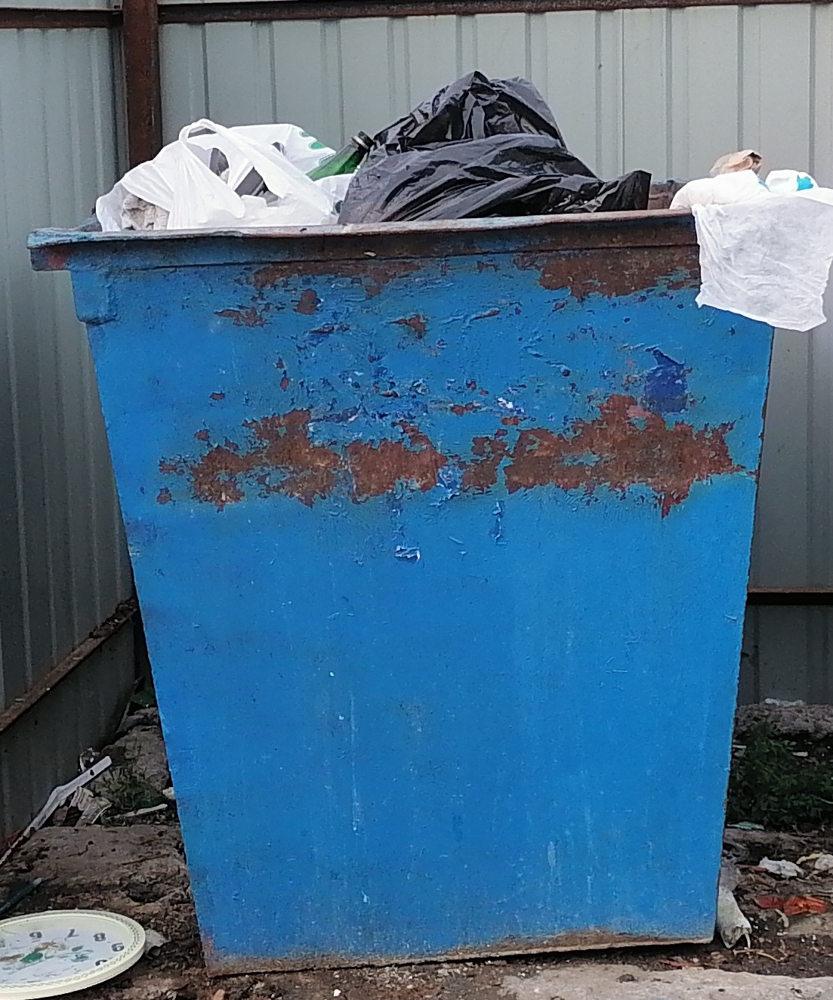

In [38]:
# Test image
path = '96_1.jpg'
load_img(path)

In [11]:
img = load_img(path, target_size=(299, 299))

In [12]:
import numpy as np

In [13]:
x = np.array(img)
X = np.array([x])
X.shape

(1, 299, 299, 3)

In [14]:
X = preprocess_input(X)

In [15]:
pred = model.predict(X)

1/1 [==============================] - 1s 608ms/step


In [16]:
classes = ['empty', 'full', 'halfempty']

In [17]:
dict(zip(classes, pred[0]))

{'empty': 0.5267357, 'full': 2.815311, 'halfempty': -3.7821054}

In [184]:
tf.saved_model.save(model, 'garbage-model')

INFO:tensorflow:Assets written to: garbage-model\assets


INFO:tensorflow:Assets written to: garbage-model\assets
